### Problem Statement

Death caused by cardiovascular diease is very common. In 2021, cadiovascular diease alone accounted for 32% of the deaths in Singapore. Cardiovascular disease can occur to anyone and at any age. Especially in Singapore with high standard of living,  citizens indulge in unhealhy diets and habits. 

### Objective

To find out whether one is at risk for cardiovascular diease using classification models and which model will be the best for such senario.

### Import Libraries

In [1]:
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt # we only need pyplot
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from math import floor
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import naive_bayes
import category_encoders as ce
import plotly.express as px
import plotly.graph_objects as go
sb.set() 

### Exploratory Data Analysis

In [2]:
data = pd.read_csv('cardio_train.csv', delimiter=";")
data.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0


Description of the dataset, as available on Kaggle, is as follows. Learn more : https://www.kaggle.com/datasets/sulianova/cardiovascular-disease-dataset

> 1. **Age** | Objective Feature | age | int (days)  
> 2. **Height** | Objective Feature | height | int (cm) |  
> 3. **Weight** | Objective Feature | weight | float (kg) |  
> 4. **Gender** | Objective Feature | gender | 1: women, 2: men |  
> 5. **Systolic blood pressure** | Examination Feature | ap_hi | int |  
> 6. **Diastolic blood pressure** | Examination Feature | ap_lo | int |  
> 7. **Cholesterol** | Examination Feature | cholesterol | 1: normal, 2: above normal, 3: well above normal |  
> 8. **Glucose** | Examination Feature | gluc | 1: normal, 2: above normal, 3: well above normal |  
> 9. **Smoking** | Subjective Feature | smoke | binary |  
> 10. **Alcohol intake** | Subjective Feature | alco | binary |  
> 11. **Physical activity** | Subjective Feature | active | binary |  
> 12. **Presence or absence** of cardiovascular disease | Target Variable | cardio | binary |

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70000 entries, 0 to 69999
Data columns (total 13 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   id           70000 non-null  int64  
 1   age          70000 non-null  int64  
 2   gender       70000 non-null  int64  
 3   height       70000 non-null  int64  
 4   weight       70000 non-null  float64
 5   ap_hi        70000 non-null  int64  
 6   ap_lo        70000 non-null  int64  
 7   cholesterol  70000 non-null  int64  
 8   gluc         70000 non-null  int64  
 9   smoke        70000 non-null  int64  
 10  alco         70000 non-null  int64  
 11  active       70000 non-null  int64  
 12  cardio       70000 non-null  int64  
dtypes: float64(1), int64(12)
memory usage: 6.9 MB


In [4]:
data.describe()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
count,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000
mean,49972.419900,19468.865814,1.349571,164.359229,74.205690,128.817286,96.630414,1.366871,1.226457,0.088129,0.053771,0.803729,0.499700
std,28851.302323,2467.251667,0.476838,8.210126,14.395757,154.011419,188.472530,0.680250,0.572270,0.283484,0.225568,0.397179,0.500003
min,0.000000,10798.000000,1.000000,55.000000,10.000000,-150.000000,-70.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,25006.750000,17664.000000,1.000000,159.000000,65.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
50%,50001.500000,19703.000000,1.000000,165.000000,72.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
75%,74889.250000,21327.000000,2.000000,170.000000,82.000000,140.000000,90.000000,2.000000,1.000000,0.000000,0.000000,1.000000,1.000000
max,99999.000000,23713.000000,2.000000,250.000000,200.000000,16020.000000,11000.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000


In [5]:
# age = pd.DataFrame(data['age'])
# height = pd.DataFrame(data['height'])
# weight = pd.DataFrame(data['weight'])
# ap_hi = pd.DataFrame(data['ap_hi'])
# ap_lo = pd.DataFrame(data['ap_lo'])
# chol = pd.DataFrame(data['cholesterol'])
# gluc = pd.DataFrame(data['gluc'])
# smoke = pd.DataFrame(data['smoke'])
# alco = pd.DataFrame(data['alco'])
# active = pd.DataFrame(data['active'])
# cardio = pd.DataFrame(data['cardio'])

(None, None)

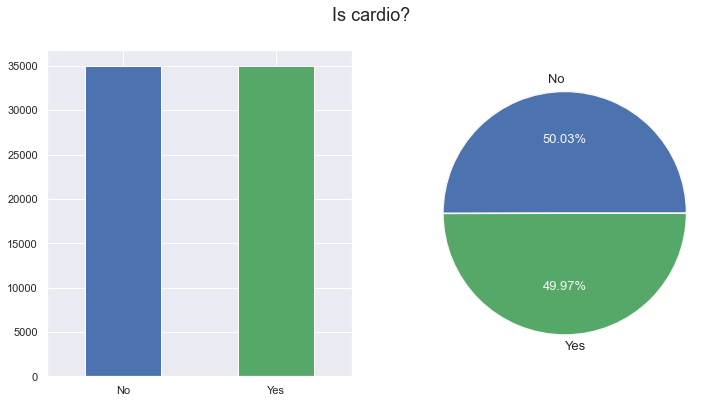

In [6]:
#Ratio of Cardiovascular disease  
f, ax = plt.subplots(1, 2, figsize = (12, 6))
f.suptitle("Is cardio?", fontsize = 18.)
bar_1 = data.cardio.value_counts().plot.bar(ax = ax[0], rot = 0, 
                                            color = (sb.color_palette()[0], sb.color_palette()[2])).set(xticklabels = ["No", "Yes"])
pie_1 = data.cardio.value_counts().plot.pie(labels = ("No", "Yes"), autopct = "%.2f%%", 
                                            label = "", fontsize = 13., ax = ax[1],\
colors = (sb.color_palette()[0], sb.color_palette()[2]), wedgeprops = {"linewidth": 1.5, "edgecolor": "#F7F7F7"}), 
ax[1].texts[1].set_color("#F7F7F7"), ax[1].texts[3].set_color("#F7F7F7")

In [7]:
numData=data[['height','weight','ap_hi','ap_lo']]

In [8]:
#Box plot with plotly
fig = go.Figure()

for col in numData:
  fig.add_trace(go.Box(x=numData[col].values, name=numData[col].name))
  
fig.show()

Observation:
There are outliners with extremely large or negative values.

In [9]:
fig = px.box(data, x="age")
fig.show()

<AxesSubplot:>

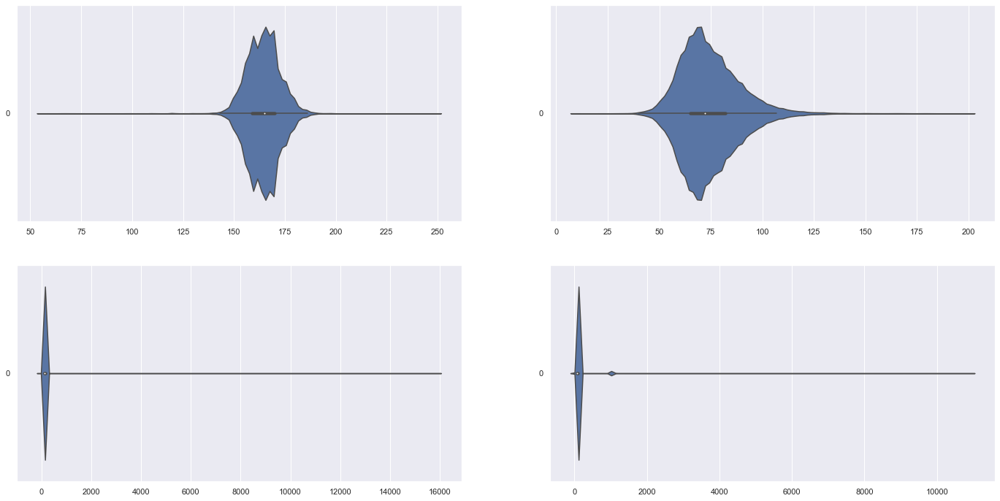

In [10]:
#Violin plot to see the distribution
f, axes = plt.subplots(2, 2, figsize=(24, 12))

sb.violinplot(data = data["height"], orient = "h", ax = axes[0,0])
sb.violinplot(data = data["weight"], orient = "h", ax = axes[0,1])
sb.violinplot(data = data["ap_hi"], orient = "h", ax = axes[1,0])
sb.violinplot(data = data["ap_lo"], orient = "h", ax = axes[1,1])

<AxesSubplot:>

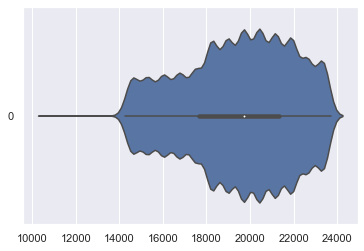

In [11]:
sb.violinplot(data = data["age"], orient = "h")

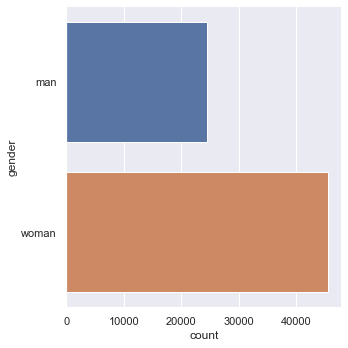

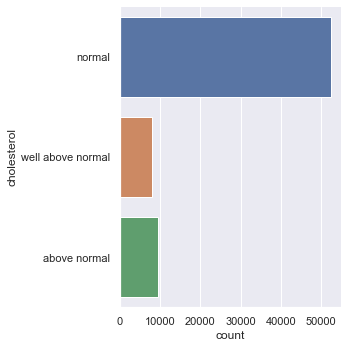

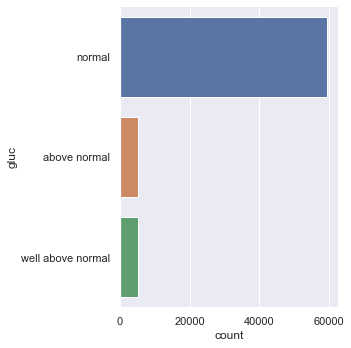

In [12]:
#Add description to data
desc_data = data.copy(deep = True)
desc_data['gender'].replace({1: 'woman', 2: 'man'}, inplace = True)
desc_data['cholesterol'].replace({1: 'normal', 2: 'above normal', 3: 'well above normal'}, inplace = True)
desc_data['gluc'].replace({1: 'normal', 2: 'above normal', 3: 'well above normal'}, inplace = True)
desc_data['smoke'].replace({0: 'No', 1: 'Yes'}, inplace = True)
desc_data['alco'].replace({0: 'No', 1: 'Yes'}, inplace = True)
desc_data['active'].replace({0: 'No', 1: 'Yes'}, inplace = True)
desc_data['cardio'].replace({0: 'No', 1: 'Yes'}, inplace = True)
#For category data
sb.catplot(y = "gender", data = desc_data, kind = "count")
sb.catplot(y = "cholesterol", data = desc_data, kind = "count")
sb.catplot(y = "gluc", data = desc_data, kind = "count")

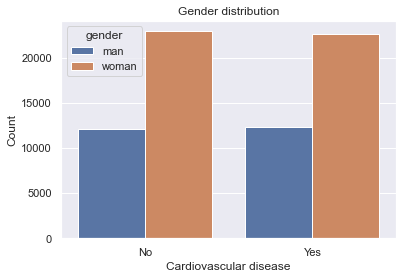

In [13]:
#using seaborns countplot 
sb.countplot(data =desc_data,x='cardio',hue='gender')
#setting axis labels
plt.title('Gender distribution')
plt.xlabel('Cardiovascular disease')
plt.ylabel('Count');

Observation:
More than half of the patient have normal glucose and cholesterol level.
The ratio of woman to man is almost 2:1.In general, there are more women with cardiovascular disease.

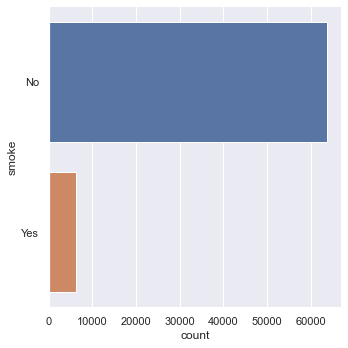

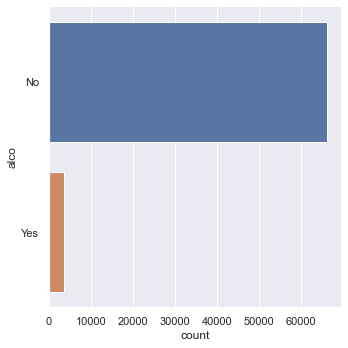

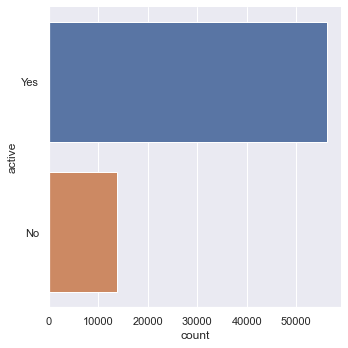

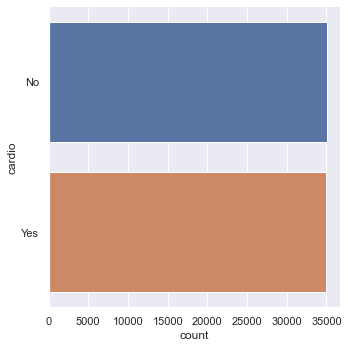

In [14]:
#For boolean data
sb.catplot(y = "smoke", data = desc_data, kind = "count")
sb.catplot(y = "alco", data = desc_data, kind = "count")
sb.catplot(y = "active", data = desc_data, kind = "count")
sb.catplot(y = "cardio", data = desc_data, kind = "count")

### Data Transformation

In [15]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70000 entries, 0 to 69999
Data columns (total 13 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   id           70000 non-null  int64  
 1   age          70000 non-null  int64  
 2   gender       70000 non-null  int64  
 3   height       70000 non-null  int64  
 4   weight       70000 non-null  float64
 5   ap_hi        70000 non-null  int64  
 6   ap_lo        70000 non-null  int64  
 7   cholesterol  70000 non-null  int64  
 8   gluc         70000 non-null  int64  
 9   smoke        70000 non-null  int64  
 10  alco         70000 non-null  int64  
 11  active       70000 non-null  int64  
 12  cardio       70000 non-null  int64  
dtypes: float64(1), int64(12)
memory usage: 6.9 MB


In [16]:
for col in ['gender', 'cholesterol', 'gluc']:
    data[col] = data[col].astype('category')
    
for col in ['smoke', 'alco', 'active', 'cardio']:
    data[col] = data[col].astype('bool')

In [17]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70000 entries, 0 to 69999
Data columns (total 13 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   id           70000 non-null  int64   
 1   age          70000 non-null  int64   
 2   gender       70000 non-null  category
 3   height       70000 non-null  int64   
 4   weight       70000 non-null  float64 
 5   ap_hi        70000 non-null  int64   
 6   ap_lo        70000 non-null  int64   
 7   cholesterol  70000 non-null  category
 8   gluc         70000 non-null  category
 9   smoke        70000 non-null  bool    
 10  alco         70000 non-null  bool    
 11  active       70000 non-null  bool    
 12  cardio       70000 non-null  bool    
dtypes: bool(4), category(3), float64(1), int64(5)
memory usage: 3.7 MB


In [18]:
#Convert age from days to years
data['age'] = data['age'].apply(lambda x: floor(x/365))
data

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0,50,2,168,62.0,110,80,1,1,False,False,True,False
1,1,55,1,156,85.0,140,90,3,1,False,False,True,True
2,2,51,1,165,64.0,130,70,3,1,False,False,False,True
3,3,48,2,169,82.0,150,100,1,1,False,False,True,True
4,4,47,1,156,56.0,100,60,1,1,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
69995,99993,52,2,168,76.0,120,80,1,1,True,False,True,False
69996,99995,61,1,158,126.0,140,90,2,2,False,False,True,True
69997,99996,52,2,183,105.0,180,90,3,1,False,True,False,True
69998,99998,61,1,163,72.0,135,80,1,2,False,False,False,True


### Data Cleaning

In [19]:
#id not relevant for prediction
cardioData = data.drop(['id'], axis=1)

#Check if there are any missing values and duplicates
missing = cardioData.isna().sum().sum()
print('Number of Missing values:', missing, '\n')

duplicate = cardioData.duplicated().sum()
if duplicate:
    print('Number of duplicated rows in dataset are:', duplicate)
else:
    print('There are no duplicated rows in the dataset.')

Number of Missing values: 0 

Number of duplicated rows in dataset are: 3208


In [20]:
#Remove duplicated rows
cardioData.drop_duplicates(inplace = True)
cardioData

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,50,2,168,62.0,110,80,1,1,False,False,True,False
1,55,1,156,85.0,140,90,3,1,False,False,True,True
2,51,1,165,64.0,130,70,3,1,False,False,False,True
3,48,2,169,82.0,150,100,1,1,False,False,True,True
4,47,1,156,56.0,100,60,1,1,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...
69994,57,1,165,80.0,150,80,1,1,False,False,True,True
69996,61,1,158,126.0,140,90,2,2,False,False,True,True
69997,52,2,183,105.0,180,90,3,1,False,True,False,True
69998,61,1,163,72.0,135,80,1,2,False,False,False,True


In [21]:
# Remove negative values
cardioData = cardioData[(cardioData['height'] >= 0) & (cardioData['weight'] >= 0) & (cardioData['ap_lo'] >= 0) & (cardioData['ap_hi'] >= 0)]

# Remove irregular values
cardioData = cardioData[(cardioData['ap_lo'] < cardioData['ap_hi'])]

In [22]:
# Calculate Inter-Quartile Range(IQR)
Q1_height = np.percentile(cardioData['height'], 25, interpolation = 'midpoint')

Q3_height = np.percentile(cardioData['height'], 75, interpolation = 'midpoint')

IQR_height = Q3_height - Q1_height

Q1_weight = np.percentile(cardioData['weight'], 25, interpolation = 'midpoint')

Q3_weight = np.percentile(cardioData['weight'], 75, interpolation = 'midpoint')

IQR_weight = Q3_weight - Q1_weight

Q1_ap_hi = np.percentile(cardioData['ap_hi'], 25, interpolation = 'midpoint')

Q3_ap_hi = np.percentile(cardioData['ap_hi'], 75, interpolation = 'midpoint')

IQR_ap_hi = Q3_ap_hi - Q1_ap_hi

Q1_ap_lo = np.percentile(cardioData['ap_lo'], 25, interpolation = 'midpoint')

Q3_ap_lo = np.percentile(cardioData['ap_lo'], 75, interpolation = 'midpoint')

IQR_ap_lo = Q3_ap_lo - Q1_ap_lo

In [23]:
# Remove outliers
cardioData = cardioData[((cardioData['height']) >= (Q1_height-1.5*IQR_height)) & ((cardioData['height']) <= (Q3_height+1.5*IQR_height))]

cardioData = cardioData[((cardioData['weight']) >= (Q1_weight-1.5*IQR_weight)) & ((cardioData['weight']) <= (Q3_weight+1.5*IQR_weight))]

cardioData = cardioData[((cardioData['ap_hi']) >= (Q1_ap_hi-1.5*IQR_ap_hi)) & ((cardioData['ap_hi']) <= (Q3_ap_hi +1.5*IQR_ap_hi))]

cardioData = cardioData[((cardioData['ap_lo']) >= (Q1_ap_lo-1.5*IQR_ap_lo)) & ((cardioData['ap_lo']) <= (Q3_ap_lo+ 1.5*IQR_ap_lo))]

In [24]:
#Systolic blood pressure more than 180mm Hg or diastolic blood pressure more than 120 mm Hg are considered medical emergency
outliers = len(cardioData[(cardioData["ap_hi"]>=180) | (cardioData["ap_lo"]>=120) | (cardioData["ap_lo"] < 0) | (cardioData["ap_hi"] < 0) | (cardioData["ap_hi"]<cardioData["ap_lo"])])

print("Total number of outliers are", outliers)


Total number of outliers are 0


In [25]:
clean = cardioData
clean

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,50,2,168,62.0,110,80,1,1,False,False,True,False
1,55,1,156,85.0,140,90,3,1,False,False,True,True
2,51,1,165,64.0,130,70,3,1,False,False,False,True
3,48,2,169,82.0,150,100,1,1,False,False,True,True
5,60,1,151,67.0,120,80,2,2,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...
69992,51,1,161,56.0,170,90,1,1,False,False,True,True
69993,53,1,172,70.0,130,90,1,1,False,False,True,True
69994,57,1,165,80.0,150,80,1,1,False,False,True,True
69998,61,1,163,72.0,135,80,1,2,False,False,False,True


In [26]:
clean_num=clean[['height','weight','ap_hi','ap_lo']]
#Box plot with plotly
fig = go.Figure()

for col in clean_num:
  fig.add_trace(go.Box(x=clean_num[col].values, name=clean_num[col].name))
  
fig.show()

In [27]:
#Dataset after cleaning
print('Number of rows of dataset after processing:', len(clean))
print('Percentage of remaining data :', round((len(clean))/70000*100,2), '%')

Number of rows of dataset after processing: 59312
Percentage of remaining data : 84.73 %


### Machine Learning: Classification

<AxesSubplot:>

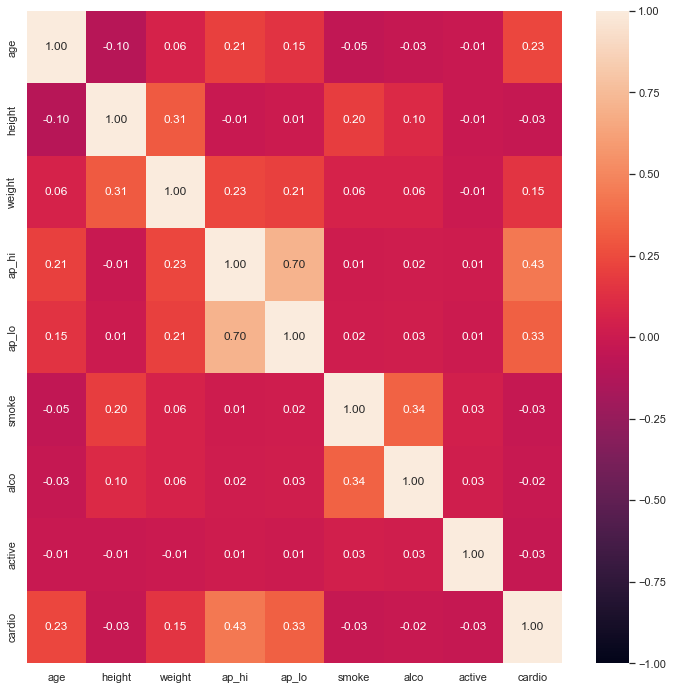

In [28]:
# Heatmap of the Correlation Matrix
f = plt.figure(figsize=(12, 12))
sb.heatmap(clean.corr(), vmin = -1, vmax = 1, annot = True, fmt = ".2f")

### Train test split

In [29]:
# Extract Response and Predictors
#All features
y = pd.DataFrame(clean["cardio"])
X = pd.DataFrame(clean.drop(["cardio"], axis =1))

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state= 50, shuffle = True)

In [30]:
# Extract Response and Predictors (Continuous Data)
#All features
y_con = pd.DataFrame(clean["cardio"])
X_con = pd.DataFrame(clean[["age","height","weight","ap_hi","ap_lo"]])

# Split the Dataset into Train and Test
X_con_train, X_con_test, y_con_train, y_con_test = train_test_split(X_con, y_con, test_size = 0.25, random_state= 50, shuffle = True)

In [31]:
# Extract Response and Predictors (Categorical Data)
#All features
y_cat = pd.DataFrame(clean["cardio"])
X_cat = pd.DataFrame(clean[["gender","cholesterol","gluc","smoke","alco","active"]])

# Split the Dataset into Train and Test
X_cat_train, X_cat_test, y_cat_train, y_cat_test = train_test_split(X_cat, y_cat, test_size = 0.25, random_state= 50, shuffle = True)

In [32]:
#Important features
y_feat = pd.DataFrame(clean["cardio"])
X_feat =  pd.DataFrame(clean.drop(["cardio","height","smoke","alco","active"], axis =1))

# Split the Dataset into Train and Test
X_feat_train, X_feat_test, y_feat_train, y_feat_test = train_test_split(X_feat, y_feat, test_size = 0.25, random_state= 50, shuffle = True)

In [33]:
#Important features (Continuous Data)
y_feat_con = pd.DataFrame(clean["cardio"])
X_feat_con =  pd.DataFrame(clean[["age","weight","ap_hi","ap_lo"]])

# Split the Dataset into Train and Test
X_feat_con_train, X_feat_con_test, y_feat_con_train, y_feat_con_test = train_test_split(X_feat_con, y_feat_con, test_size = 0.25, random_state= 50, shuffle = True)

In [34]:
#Important features (Categorical Data)
y_feat_cat = pd.DataFrame(clean["cardio"])
X_feat_cat =  pd.DataFrame(clean[["gender","cholesterol","gluc"]])

# Split the Dataset into Train and Test
X_feat_cat_train, X_feat_cat_test, y_feat_cat_train, y_feat_cat_test = train_test_split(X_feat_cat, y_feat_cat, test_size = 0.25, random_state= 50, shuffle = True)

### Model 1: Naive Bayes
### With All Features

***Gaussian Naive Bayes***

In [35]:
#Create a Gaussian Classifier
model = GaussianNB()

# Train the model using the training sets
model.fit(X_con_train,y_con_train.values.ravel())

GaussianNB()

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.7006114558043341

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.7028594550849744



<AxesSubplot:>

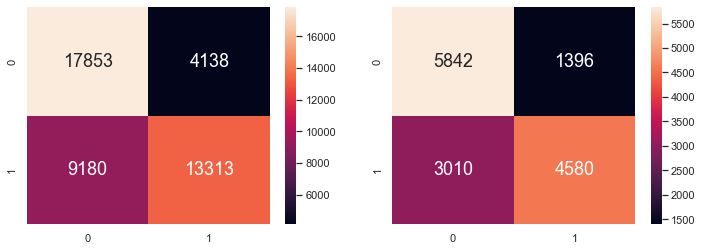

In [36]:
# Predict Response corresponding to Predictors
y_train_pred = model.predict(X_con_train)
y_test_pred = model.predict(X_con_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", model.score(X_con_train, y_con_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", model.score(X_con_test, y_con_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_con_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_con_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

***Bernoulli Naive Bayes***

In [37]:
#Encode gender, cholesterol and gluc into boolean so that these data can be used for the model

encoder = ce.OneHotEncoder(cols=["gender","cholesterol","gluc"])

X_cat_train = encoder.fit_transform(X_cat_train)

X_cat_test = encoder.transform(X_cat_test)

In [38]:
for col in ['gender_1', 'gender_2', 'cholesterol_1', 'cholesterol_2', 'cholesterol_3', 'gluc_1', 'gluc_2', 'gluc_3']:
    X_cat_train[col] = X_cat_train[col].astype('bool')
    X_cat_test[col] = X_cat_test[col].astype('bool')

In [39]:
X_cat_train.head()

,gender_1,gender_2,cholesterol_1,cholesterol_2,cholesterol_3,gluc_1,gluc_2,gluc_3,smoke,alco,active
56269,True,False,True,False,False,True,False,False,False,False,True
61656,False,True,False,True,False,False,True,False,False,False,True
10099,False,True,False,False,True,False,True,False,False,False,True
68635,False,True,False,True,False,False,True,False,False,True,False
7323,False,True,False,False,True,False,True,False,False,False,True


In [40]:
X_cat_test.head()

,gender_1,gender_2,cholesterol_1,cholesterol_2,cholesterol_3,gluc_1,gluc_2,gluc_3,smoke,alco,active
50282,False,True,False,False,True,False,True,False,False,False,True
42444,True,False,False,False,True,False,True,False,False,False,True
34500,True,False,True,False,False,True,False,False,False,False,True
49813,False,True,False,False,True,False,True,False,False,False,True
61291,False,True,False,False,True,False,True,False,False,False,True


In [41]:
model = naive_bayes.BernoulliNB()
model.fit(X_cat_train, y_cat_train.values.ravel())

BernoulliNB()

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.5823217336570452

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.577893175074184



<AxesSubplot:>

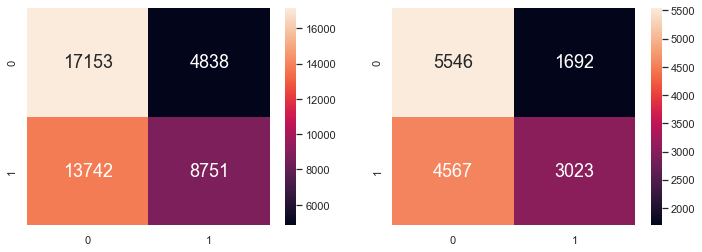

In [42]:
# Predict Response corresponding to Predictors
y_train_pred = model.predict(X_cat_train)
y_test_pred = model.predict(X_cat_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", model.score(X_cat_train, y_cat_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", model.score(X_cat_test, y_cat_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_cat_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_cat_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

### With Key Features Only

***Gaussian Naive Bayes***

In [43]:
#Create a Gaussian Classifier
model = GaussianNB()

# Train the model using the training sets
model.fit(X_feat_con_train,y_feat_con_train.values.ravel())

GaussianNB()

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.7001168959625933

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.7020501753439439



<AxesSubplot:>

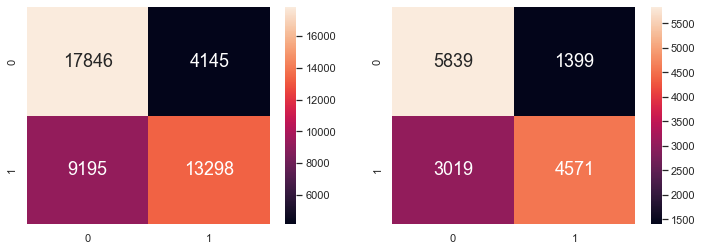

In [44]:
# Predict Response corresponding to Predictors
y_train_pred = model.predict(X_feat_con_train)
y_test_pred = model.predict(X_feat_con_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", model.score(X_feat_con_train, y_feat_con_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", model.score(X_feat_con_test, y_feat_con_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_feat_con_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_feat_con_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

In [45]:
# Model Accuracy
gnb = metrics.accuracy_score(y_feat_con_test, y_test_pred)
print("Accuracy:",gnb)

Accuracy: 0.7020501753439439


***Bernoulli Naive Bayes***

In [46]:
encoder = ce.OneHotEncoder(cols=["gender","cholesterol","gluc"])

X_feat_cat_train = encoder.fit_transform(X_feat_cat_train)

X_feat_cat_test = encoder.transform(X_feat_cat_test)

In [47]:
for col in ['gender_1', 'gender_2', 'cholesterol_1', 'cholesterol_2', 'cholesterol_3', 'gluc_1', 'gluc_2', 'gluc_3']:
    X_feat_cat_train[col] = X_feat_cat_train[col].astype('bool')
    X_feat_cat_test[col] = X_feat_cat_test[col].astype('bool')

In [48]:
model = naive_bayes.BernoulliNB()
model.fit(X_feat_cat_train, y_feat_cat_train.values.ravel())

BernoulliNB()

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.5824566136138837

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.5776908551389264



<AxesSubplot:>

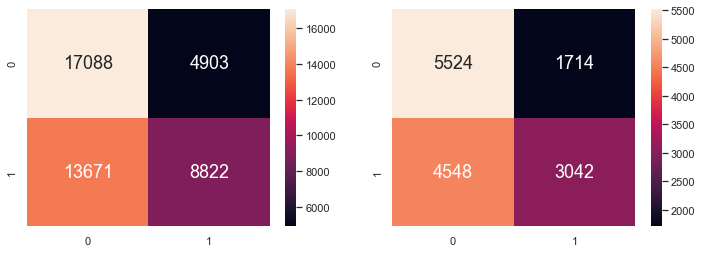

In [49]:
# Predict Response corresponding to Predictors
y_train_pred = model.predict(X_feat_cat_train)
y_test_pred = model.predict(X_feat_cat_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", model.score(X_feat_cat_train, y_feat_cat_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", model.score(X_feat_cat_test, y_feat_cat_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_feat_cat_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_feat_cat_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

In [50]:
# Model Accuracy
bnb = metrics.accuracy_score(y_feat_cat_test, y_test_pred)
print("Accuracy:",bnb)

Accuracy: 0.5776908551389264


### Model 2: Decision Tree

### With All Features (max_depth = 2)

In [51]:
# Create a Decision Tree Classifier object
dectree = DecisionTreeClassifier(max_depth = 2)

In [52]:
# Train the Decision Tree Classifier model
dectree.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=2)

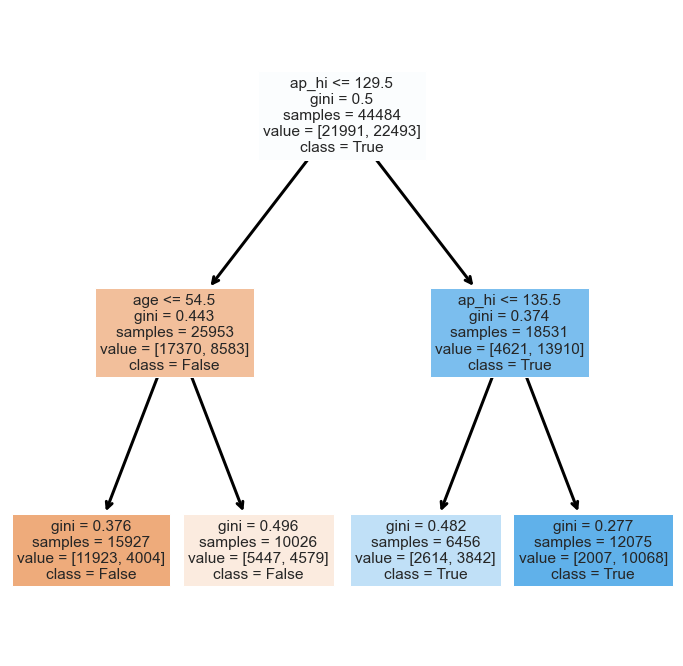

In [53]:
from sklearn.tree import plot_tree
fig, ax = plt.subplots(figsize=(12, 12))
out = plot_tree(dectree, 
          feature_names = X_train.columns,
          class_names = [str(x) for x in dectree.classes_],
          filled=True)

for o in out:
    arrow = o.arrow_patch
    if arrow is not None:
        arrow.set_edgecolor('black')
        arrow.set_linewidth(3)
        
plt.show()

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.703174174984264

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.7056244942001618



<AxesSubplot:>

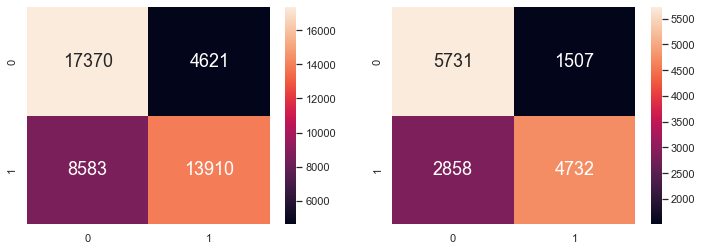

In [54]:
# Predict Response corresponding to Predictors
y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

### With All Features (max_depth = 5)

In [55]:
# Create a Decision Tree Classifier object
dectree = DecisionTreeClassifier(max_depth = 5)

In [56]:
# Train the Decision Tree Classifier model
dectree.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=5)

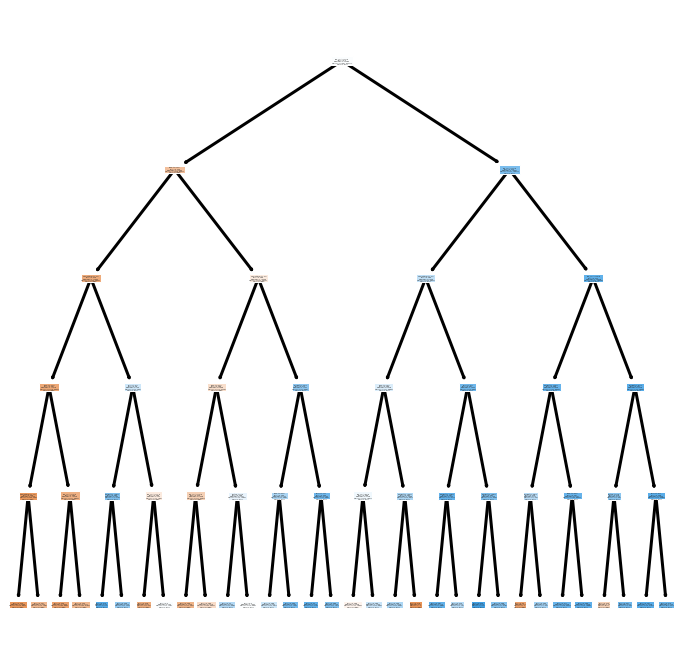

In [57]:
from sklearn.tree import plot_tree
fig, ax = plt.subplots(figsize=(12, 12))
out = plot_tree(dectree, 
          feature_names = X_train.columns,
          class_names = [str(x) for x in dectree.classes_],
          filled=True)

for o in out:
    arrow = o.arrow_patch
    if arrow is not None:
        arrow.set_edgecolor('black')
        arrow.set_linewidth(3)
        
plt.show()

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.722956568653898

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.7240356083086054



<AxesSubplot:>

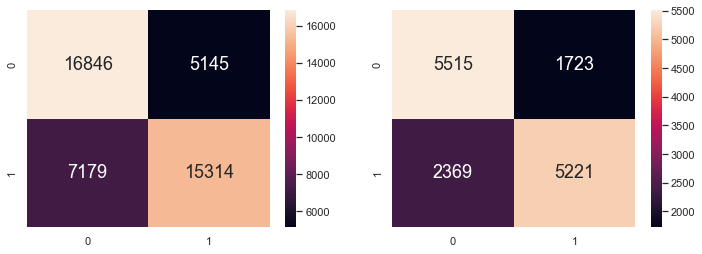

In [58]:
# Predict Response corresponding to Predictors
y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

### With All Features (max_depth = 10)

In [59]:
# Create a Decision Tree Classifier object
dectree = DecisionTreeClassifier(max_depth = 10)

In [60]:
# Train the Decision Tree Classifier model
dectree.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=10)

In [61]:
# from sklearn.tree import plot_tree
# fig, ax = plt.subplots(figsize=(12, 12))
# out = plot_tree(dectree, 
#           feature_names = X_train.columns,
#           class_names = [str(x) for x in dectree.classes_],
#           filled=True)

# for o in out:
#     arrow = o.arrow_patch
#     if arrow is not None:
#         arrow.set_edgecolor('black')
#         arrow.set_linewidth(3)
        
# plt.show()

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.7427389623235321

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.7149312112220124



<AxesSubplot:>

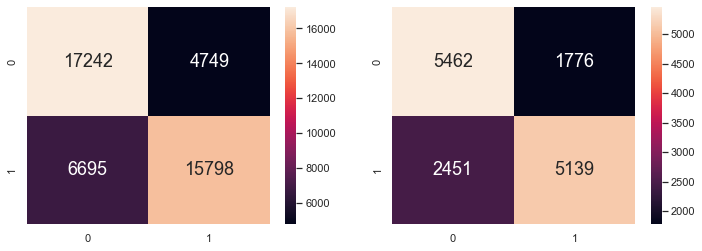

In [62]:
# Predict Response corresponding to Predictors
y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

### With All Features (no max_depth)

In [63]:
# Create a Decision Tree Classifier object
dectree = DecisionTreeClassifier()

In [64]:
# Train the Decision Tree Classifier model
dectree.fit(X_train, y_train)

DecisionTreeClassifier()

In [65]:
# from sklearn.tree import plot_tree
# fig, ax = plt.subplots(figsize=(12, 12))
# out = plot_tree(dectree, 
#           feature_names = X_train.columns,
#           class_names = [str(x) for x in dectree.classes_],
#           filled=True)

# for o in out:
#     arrow = o.arrow_patch
#     if arrow is not None:
#         arrow.set_edgecolor('black')
#         arrow.set_linewidth(3)
        
# plt.show()

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.9821508857117166

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.6097922848664689



<AxesSubplot:>

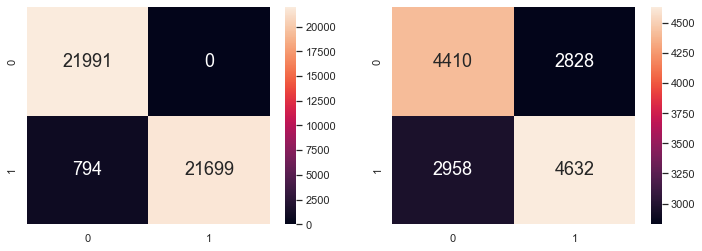

In [66]:
# Predict Response corresponding to Predictors
y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

Overfit occurs when max_depth is not limited.

### With Key Features (max_depth = 2)

In [67]:
# Create a Decision Tree Classifier object
dectree = DecisionTreeClassifier(max_depth = 2)

In [68]:
# Train the Decision Tree Classifier model
dectree.fit(X_feat_train, y_feat_train)

DecisionTreeClassifier(max_depth=2)

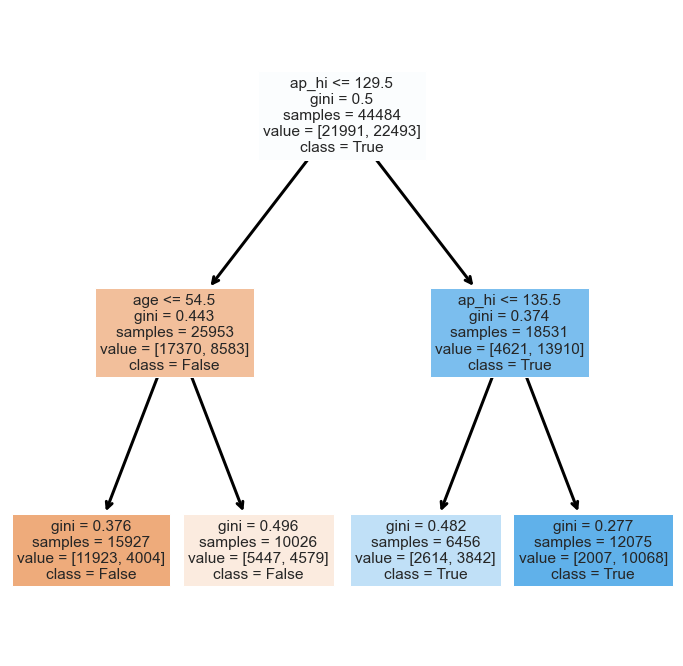

In [69]:
from sklearn.tree import plot_tree
fig, ax = plt.subplots(figsize=(12, 12))
out = plot_tree(dectree, 
          feature_names = X_feat_train.columns,
          class_names = [str(x) for x in dectree.classes_],
          filled=True)

for o in out:
    arrow = o.arrow_patch
    if arrow is not None:
        arrow.set_edgecolor('black')
        arrow.set_linewidth(3)
        
plt.show()

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.703174174984264

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.7056244942001618



<AxesSubplot:>

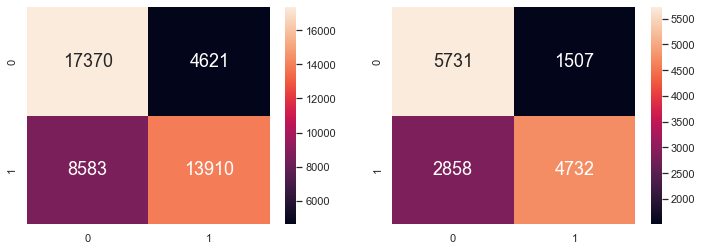

In [70]:
# Predict Response corresponding to Predictors
y_feat_train_pred = dectree.predict(X_feat_train)
y_feat_test_pred = dectree.predict(X_feat_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_feat_train, y_feat_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_feat_test, y_feat_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_feat_train, y_feat_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_feat_test, y_feat_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

In [71]:
# Model Accuracy
dt2 = metrics.accuracy_score(y_feat_test, y_feat_test_pred)
print("Accuracy:",dt2)

Accuracy: 0.7056244942001618


### With Key Features (max_depth = 5)

In [72]:
# Create a Decision Tree Classifier object
dectree = DecisionTreeClassifier(max_depth = 5)

In [73]:
# Train the Decision Tree Classifier model
dectree.fit(X_feat_train, y_feat_train)

DecisionTreeClassifier(max_depth=5)

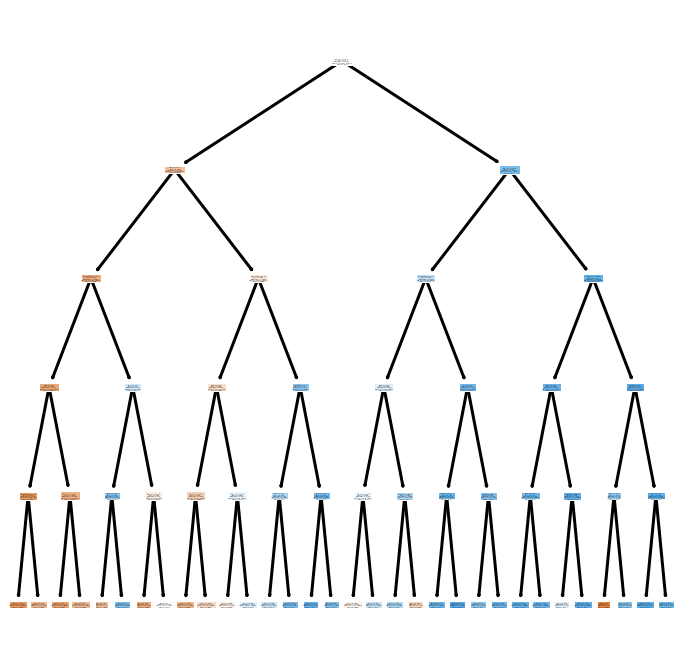

In [74]:
from sklearn.tree import plot_tree
fig, ax = plt.subplots(figsize=(12, 12))
out = plot_tree(dectree, 
          feature_names = X_feat_train.columns,
          class_names = [str(x) for x in dectree.classes_],
          filled=True)

for o in out:
    arrow = o.arrow_patch
    if arrow is not None:
        arrow.set_edgecolor('black')
        arrow.set_linewidth(3)
        
plt.show()

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.7236984084165093

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.7251146479633126



<AxesSubplot:>

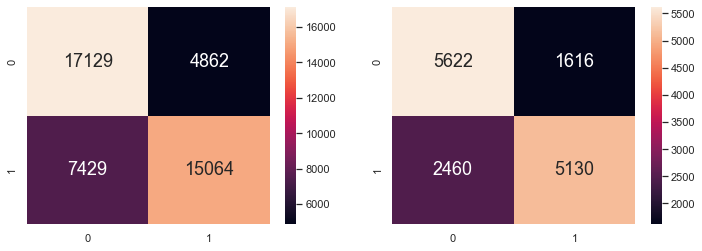

In [75]:
# Predict Response corresponding to Predictors
y_feat_train_pred = dectree.predict(X_feat_train)
y_feat_test_pred = dectree.predict(X_feat_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_feat_train, y_feat_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_feat_test, y_feat_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_feat_train, y_feat_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_feat_test, y_feat_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

In [76]:
# Model Accuracy
dt5 = metrics.accuracy_score(y_feat_test, y_feat_test_pred)
print("Accuracy:",dt5)

Accuracy: 0.7251146479633126


### With Key Features (max_depth = 10)

In [77]:
# Create a Decision Tree Classifier object
dectree = DecisionTreeClassifier(max_depth = 10)

In [78]:
# Train the Decision Tree Classifier model
dectree.fit(X_feat_train, y_feat_train)

DecisionTreeClassifier(max_depth=10)

In [79]:
# from sklearn.tree import plot_tree
# fig, ax = plt.subplots(figsize=(12, 12))
# out = plot_tree(dectree, 
#           feature_names = X_feat_train.columns,
#           class_names = [str(x) for x in dectree.classes_],
#           filled=True)

# for o in out:
#     arrow = o.arrow_patch
#     if arrow is not None:
#         arrow.set_edgecolor('black')
#         arrow.set_linewidth(3)
        
# plt.show()

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.7384228037047028

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.7202589695171298



<AxesSubplot:>

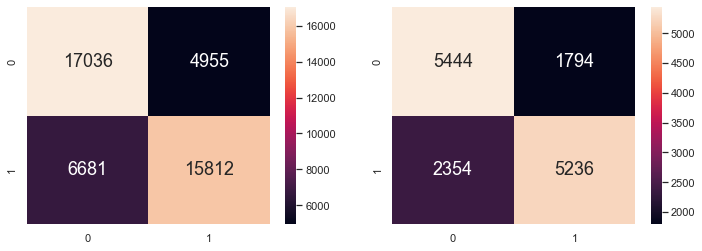

In [80]:
# Predict Response corresponding to Predictors
y_feat_train_pred = dectree.predict(X_feat_train)
y_feat_test_pred = dectree.predict(X_feat_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_feat_train, y_feat_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_feat_test, y_feat_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_feat_train, y_feat_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_feat_test, y_feat_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

In [81]:
# Model Accuracy
dt10 = metrics.accuracy_score(y_feat_test, y_feat_test_pred)
print("Accuracy:",dt10)

Accuracy: 0.7202589695171298


Overall, using key features is better than using all features.

### Model 3: Random Forest Classifier

### With All Features (max_depth = 2)

In [82]:
rf = RandomForestClassifier(n_estimators = 500, max_depth = 2, random_state = 42)

# Train the Decision Tree Classifier model
rf.fit(X_train,y_train.values.ravel())

RandomForestClassifier(max_depth=2, n_estimators=500, random_state=42)

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.7075128135958997

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.7098732128405719



<AxesSubplot:>

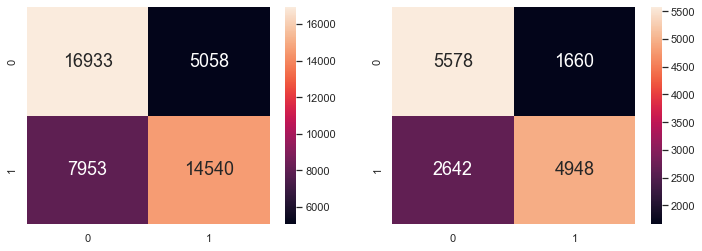

In [83]:
# Predict Response corresponding to Predictors
y_train_pred = rf.predict(X_train)
y_test_pred = rf.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", rf.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", rf.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

### With All Features (max_depth = 5)

In [84]:
rf = RandomForestClassifier(n_estimators = 500, max_depth = 5, random_state = 42)

rf.fit(X_train,y_train.values.ravel())

RandomForestClassifier(max_depth=5, n_estimators=500, random_state=42)

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.721720169049546

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.7203938494739681



<AxesSubplot:>

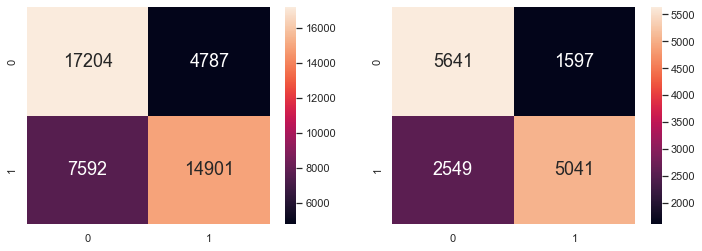

In [85]:
# Predict Response corresponding to Predictors
y_train_pred = rf.predict(X_train)
y_test_pred = rf.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", rf.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", rf.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

### With All Features (max_depth = 10)

In [86]:
rf = RandomForestClassifier(n_estimators = 500, max_depth = 10, random_state = 42)

rf.fit(X_train,y_train.values.ravel())

RandomForestClassifier(max_depth=10, n_estimators=500, random_state=42)

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.7481341605970686

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.7276099271648233



<AxesSubplot:>

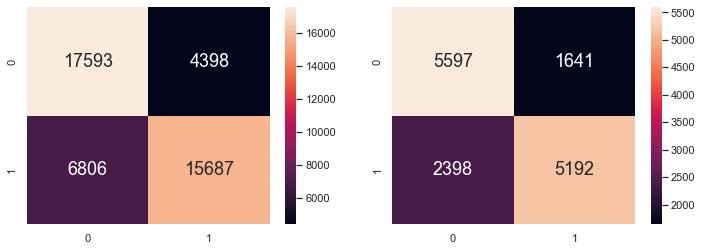

In [87]:
# Predict Response corresponding to Predictors
y_train_pred = rf.predict(X_train)
y_test_pred = rf.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", rf.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", rf.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

Overfit occurs when max_depth is too high.

### With Key Features (max_depth = 2)

In [88]:
rf = RandomForestClassifier(n_estimators = 500, max_depth = 2, random_state = 42)

rf.fit(X_feat_train,y_feat_train.values.ravel())

RandomForestClassifier(max_depth=2, n_estimators=500, random_state=42)

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.7112444924017625

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.7118289722147289



<AxesSubplot:>

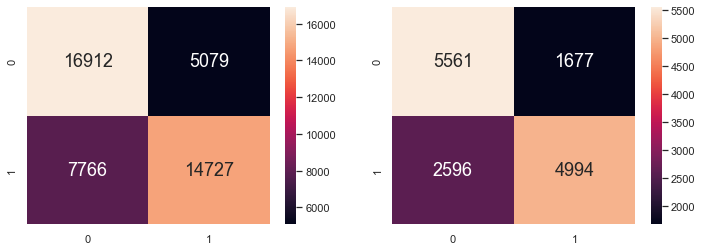

In [89]:
# Predict Response corresponding to Predictors
y_feat_train_pred = rf.predict(X_feat_train)
y_feat_test_pred = rf.predict(X_feat_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", rf.score(X_feat_train, y_feat_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", rf.score(X_feat_test, y_feat_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_feat_train, y_feat_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_feat_test, y_feat_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

In [90]:
# Model Accuracy
rf2 = metrics.accuracy_score(y_feat_test, y_feat_test_pred)
print("Accuracy:",rf2)

Accuracy: 0.7118289722147289


### With Key Features (max_depth = 5)

In [91]:
rf = RandomForestClassifier(n_estimators = 500, max_depth = 5, random_state = 42)

rf.fit(X_feat_train,y_feat_train.values.ravel())

RandomForestClassifier(max_depth=5, n_estimators=500, random_state=42)

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.7212930491862243

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.7205961694092258



<AxesSubplot:>

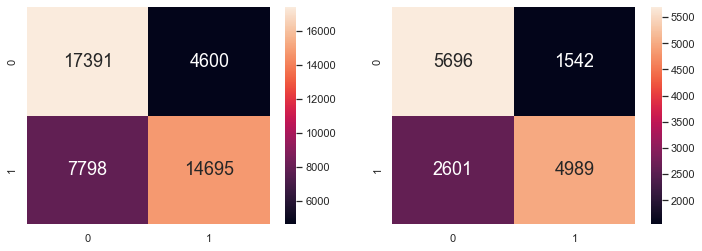

In [92]:
# Predict Response corresponding to Predictors
y_feat_train_pred = rf.predict(X_feat_train)
y_feat_test_pred = rf.predict(X_feat_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", rf.score(X_feat_train, y_feat_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", rf.score(X_feat_test, y_feat_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_feat_train, y_feat_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_feat_test, y_feat_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

In [93]:
# Model Accuracy
rf5 = metrics.accuracy_score(y_feat_test, y_feat_test_pred)
print("Accuracy:",rf5)

Accuracy: 0.7205961694092258


### With Key Features (max_depth = 10)

In [94]:
rf = RandomForestClassifier(n_estimators = 500, max_depth = 10, random_state = 42)

rf.fit(X_feat_train,y_feat_train.values.ravel())

RandomForestClassifier(max_depth=10, n_estimators=500, random_state=42)

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.7413002427839223

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.7263285675748584



<AxesSubplot:>

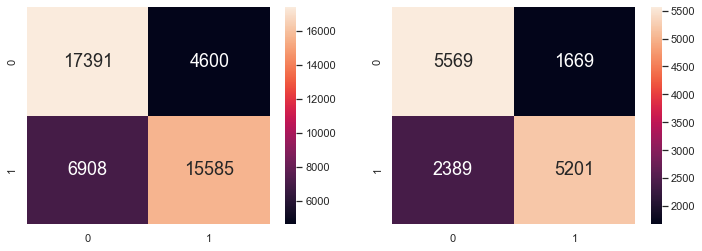

In [95]:
# Predict Response corresponding to Predictors
y_feat_train_pred = rf.predict(X_feat_train)
y_feat_test_pred = rf.predict(X_feat_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", rf.score(X_feat_train, y_feat_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", rf.score(X_feat_test, y_feat_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_feat_train, y_feat_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_feat_test, y_feat_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

In [96]:
# Model Accuracy
rf10 = metrics.accuracy_score(y_feat_test, y_feat_test_pred)
print("Accuracy:",rf10)

Accuracy: 0.7263285675748584


Overfit occurs when max_depth is too high.

Overall, using key features is better than using all features.

When max_depth = 2, Random Forest performs better than Decision Tree.  
When max_depth = 5, Decision Tree performs better than Random Forest.  
When max_depth = 10, Random Forest performs better than Decision Tree as Random Forest reduce the overfitting.

# Outcome / Demonstration

<AxesSubplot:>

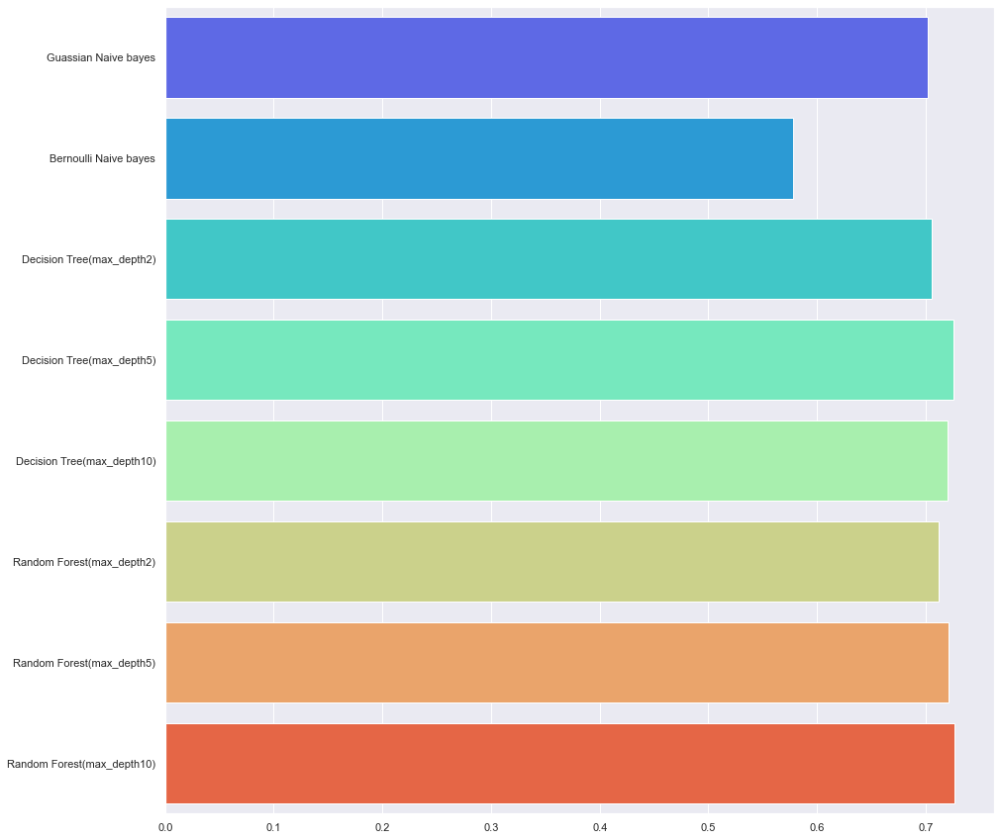

In [97]:
accuracy =  {'Guassian Naive bayes':gnb , 'Bernoulli Naive bayes':bnb , 'Decision Tree(max_depth2)':dt2 , \
             'Decision Tree(max_depth5)':dt5 , 'Decision Tree(max_depth10)': dt10, \
             'Random Forest(max_depth2)': rf2, 'Random Forest(max_depth5)':rf5 , 'Random Forest(max_depth10)':rf10 }
plt.figure(figsize=(15, 15))
model_accuracies = list(accuracy.values())
model_names = list(accuracy.keys())
sb.barplot(x=model_accuracies, y=model_names, palette='rainbow' )

Random Forest (max_depth = 10) has the highest model accuracy.

### Random Forest Demo

In [98]:
rf = RandomForestClassifier(n_estimators = 500, max_depth = 10, random_state = 42)

rf.fit(X_feat_train,y_feat_train.values.ravel())

RandomForestClassifier(max_depth=10, n_estimators=500, random_state=42)

In [99]:
# Extract few rows for Prediction
row = cardioData.sample(n=5)
X_pred = row.drop(["cardio","height","smoke","alco","active"], axis =1)

In [100]:
# Extract Predictors for Prediction
y_pred = rf.predict(X_pred)
prediction = pd.DataFrame(y_pred, columns = ["Predicted Cardio"], index = row.index)

# Summarize the Actuals and Predictions
data_acc = pd.concat([row['cardio'], prediction], axis = 1)

data_acc

,cardio,Predicted Cardio
60939,True,False
10754,True,True
20860,True,True
62786,False,False
7482,True,False


## Naive bayes demo

In [101]:
#Create a Gaussian Classifier
model = GaussianNB()

# Train the model using the training sets
model.fit(X_con_train,y_con_train.values.ravel())

GaussianNB()

In [102]:
# Extract few rows for Prediction
row = cardioData.sample(n=3)
X_con_pred = row.drop(['gender','cholesterol','gluc','smoke','alco','active','cardio'], axis =1)

In [103]:
# Extract Predictors for Prediction
y_pred = model.predict(X_con_pred)
prediction = pd.DataFrame(y_pred, columns = ["Predicted Cardio"], index = row.index)

# Summarize the Actuals and Predictions
data_acc = pd.concat([row['cardio'], prediction], axis = 1)

data_acc

,cardio,Predicted Cardio
46687,False,False
53029,False,False
19684,True,True


In [104]:
#Create a Gaussian Classifier
model = naive_bayes.BernoulliNB()

# Train the model using the training sets
model.fit(X_cat_train,y_cat_train.values.ravel())

BernoulliNB()

In [105]:
# Extract few rows for Prediction
row = cardioData.sample(n=100)
X_cat_pred = row.drop(['age','height','weight','ap_hi','ap_lo','cardio'], axis =1)

In [106]:
# encode remaining variables with one-hot encoding

encoder = ce.OneHotEncoder(cols=["gender","cholesterol","gluc"])

X_cat_pred = encoder.fit_transform(X_cat_pred)

In [107]:
X_cat_pred.head()

,gender_1,gender_2,cholesterol_1,cholesterol_2,cholesterol_3,gluc_1,gluc_2,gluc_3,smoke,alco,active
66224,1,0,1,0,0,1,0,0,False,True,True
45005,0,1,1,0,0,0,1,0,False,False,True
60056,0,1,0,1,0,1,0,0,False,False,False
2621,0,1,1,0,0,1,0,0,False,False,False
39416,1,0,1,0,0,1,0,0,False,False,True


In [108]:
# Extract Predictors for Prediction
y_pred = model.predict(X_cat_pred)
prediction = pd.DataFrame(y_pred, columns = ["Predicted Cardio"], index = row.index)

# Summarize the Actuals and Predictions
data_acc = pd.concat([row['cardio'], prediction], axis = 1)

data_acc

,cardio,Predicted Cardio
66224,True,True
45005,True,True
60056,True,True
2621,False,True
39416,False,True
...,...,...
13576,False,True
41706,False,True
31248,True,True
64607,True,True
